In [1]:
import pandas as pd
from tqdm import tqdm, trange
import re
import plotly.express as px
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Flatten, LSTM, GRU, Bidirectional
from sklearn.preprocessing import LabelBinarizer

# Cleaning
The data was recieved as a .sql file. As we all know from data analytics the most time consuming part of data science is data collection and cleaning. I have not done anything with database work for a few years so cleaning the data into something nice that I could use in Python took some time. In the end I decided to separate each row through splitting the data by the final ) of the row and the first bracket of the next row. After that I had each row in a string, although it was not perfectly separated. Due to this I had to continue to perform some data cleaning to get each row of the db into a string separated by column value. Just as a sanity check before moving on I looked at the last row of the table to make sure that it was correct. If the last row is correct then there is a very low chance that there are any mistakes throughout the data. Looking at the raw data there are a total of 45312 rows in our wallstreet dataset. Although each row was separated correctly I found that within some rows there was error. I decided for ease of data collection these rows would be removed. After cleaning there were a total of 45077 rows in the dataset. As can be seen from the raw data there are some escape characters used for the SQL. For future tokenization and machine learning these were removed from the flat content data.

In [72]:
text = []
with open('data/wallstreet.sql', 'r') as sql_file:
    raw = sql_file.read().split('),(')

In [73]:
 wallstreet = pd.DataFrame( columns=['postID', 'threadID', 'threadTitle', 'URL', 'subforum', 'authorName', 'postAuthorMembership', 'postAuthorJoinDate', 'authorReputation', 'postDate', 'postSequence', 'likes', 'flatContent', 'contentWithHTMLTag'])

In [74]:
clean = []
for row in tqdm(raw):
    try:
        broken_1 = list(re.split(r",(?=')", row))
        temp_1 = broken_1[0].split(',')
        temp_1[0] = temp_1[0].replace("(",'')
        temp_2 = broken_1[6].split(',')
        temp_3 = broken_1[7].split(',')
        final_row = temp_1 + broken_1[1:6] + temp_2 + temp_3 + broken_1[8:10]
        wallstreet.loc[len(wallstreet)] = final_row
    except:
        pass


100%|██████████| 45312/45312 [07:30<00:00, 100.54it/s]


In [75]:
wallstreet.head(10)

,postID,threadID,threadTitle,URL,subforum,authorName,postAuthorMembership,postAuthorJoinDate,authorReputation,postDate,postSequence,likes,flatContent,contentWithHTMLTag
0,INSERT INTO `wallstreet` VALUES 6,5,'Hi','http://x7bwsmcore5fmx56.onion/viewtopic.php?i...,'Introductions','Punka421','New member','2016-10-26',-3,'2016-10-26 13:58:36',1,0,'\nJust thought I\'d introduce myself. I am ne...,"'<div class=\""entry-content\"">\n<p>Just though..."
1,7,5,'Hi','http://x7bwsmcore5fmx56.onion/viewtopic.php?i...,'Introductions','WSM','Administrator','2016-10-02',66,'2016-10-26 14:04:04',2,0,'\nHello Nice to see you here!Regards\n',"'<div class=\""entry-content\"">\n<p>Hello <img ..."
2,8,6,'WSM Updates - Changelog (Page 1 of 4)','http://x7bwsmcore5fmx56.onion/viewtopic.php?i...,'Announcements','WSM','Administrator','2016-10-02',74,'2016-10-26 16:54:27',1,0,'\nHello everyone.I would like to tell you tha...,"'<div class=\""entry-content\"">\n<p>Hello every..."
3,11,5,'Hi','http://x7bwsmcore5fmx56.onion/viewtopic.php?i...,'Introductions','Estrazy','Banned','2016-10-27',0,'2016-10-27 14:00:16',3,0,'\nHello Punka! nice to meet you!As you asked ...,"'<div class=\""entry-content\"">\n<p>Hello Punka..."
4,13,6,'WSM Updates - Changelog (Page 1 of 4)','http://x7bwsmcore5fmx56.onion/viewtopic.php?i...,'Announcements','WSM','Administrator','2016-10-02',74,'2016-11-02 15:42:27',2,0,"'\nChangelog from Wednesday, 2nd November 2016...","'<div class=\""entry-content\"">\n<h5>Changelog ..."
5,14,6,'WSM Updates - Changelog (Page 1 of 4)','http://x7bwsmcore5fmx56.onion/viewtopic.php?i...,'Announcements','WSM','Administrator','2016-10-02',74,'2016-11-05 13:14:41',3,0,"'\nChangelog from Saturday, 5th November 2016W...","'<div class=\""entry-content\"">\n<h5>Changelog ..."
6,15,6,'WSM Updates - Changelog (Page 1 of 4)','http://x7bwsmcore5fmx56.onion/viewtopic.php?i...,'Announcements','WSM','Administrator','2016-10-02',74,'2016-11-08 21:06:51',4,0,"'\nChangelog from Tuesday, 8th November 2016We...","'<div class=\""entry-content\"">\n<h5>Changelog ..."
7,16,5,'Hi','http://x7bwsmcore5fmx56.onion/viewtopic.php?i...,'Introductions','Goldenchild','New member','2016-11-09',-1,'2016-11-09 10:50:40',4,0,'\nwelcome\n',"'<div class=\""entry-content\"">\n<p>welcome</p>..."
8,18,6,'WSM Updates - Changelog (Page 1 of 4)','http://x7bwsmcore5fmx56.onion/viewtopic.php?i...,'Announcements','WSM','Administrator','2016-10-02',74,'2016-11-12 13:10:43',5,0,"'\nChangelog from Saturday, 12th November 2016...","'<div class=\""entry-content\"">\n<h5>Changelog ..."
9,39,28,'key to new market might be- migrate listings ...,'http://x7bwsmcore5fmx56.onion/viewtopic.php?i...,'Feature Request','maxhavelaar','New member','2016-11-13',4,'2016-11-15 06:38:27',1,0,'\nthe ability to migrate listings from hansa ...,"'<div class=\""entry-content\"">\n<p>the ability..."


In [76]:
wallstreet.describe()

,postID,threadID,threadTitle,URL,subforum,authorName,postAuthorMembership,postAuthorJoinDate,authorReputation,postDate,postSequence,likes,flatContent,contentWithHTMLTag
count,45077,45077,45077,45077,45077,45077,45077,45077,45077,45077,45077,45077,45077,45077
unique,45077,8727,8510,8727,40,5521,8,688,123,45033,1201,1,41017,41109
top,48007,2274,'GozNym 2.0 Banking Bot (Page 2 of 3)','http://x7bwsmcore5fmx56.onion/viewtopic.php?i...,'Fraud','med3l1n','Vendor','Despacitoland',0,'2018-05-17 01:48:14',1,0,'\nBump.\nMarket & Store @ WSM: http://wallsty...,"'<div class=\""entry-content\"">\n<p>Bump.</p>\n..."
freq,1,1178,75,1178,12137,4874,15172,4874,5833,2,8671,45077,801,799


# Cleaning

In [77]:
pd.options.plotting.backend = "plotly"

## PostID tag

PostID contains no information, so it will be removed.

In [78]:
wallstreet = wallstreet.drop(['postID'], axis=1)

## Content with HTML tag

The content with HTML tag is the same as the original content, but with HTML jargen that does not hold any sentiment about the post. Due to this lack of information gain the content with html tag will be removed.

In [79]:
wallstreet = wallstreet.drop(['contentWithHTMLTag'], axis=1)

## Likes

It seems that no one on wallstreet gets any likes. Due to this it will be removed from further analysis.

In [80]:
wallstreet.likes.describe()

count     45077
unique        1
top           0
freq      45077
Name: likes, dtype: object

In [81]:
wallstreet = wallstreet.drop(['likes'], axis=1)

## postAuthorJoinDate

It seems that some of the join date is corrupted, and contains values such as "today", so it will be removed

In [82]:
wallstreet = wallstreet.drop(['postAuthorJoinDate'], axis=1)

## postDate
All corrupt data points were removed (170). It is interesting to see how wallstreet was not used very much until late 2017 when it started to really take off in popularity.

In [83]:
wallstreet.postDate = pd.to_datetime(wallstreet.postDate, errors='coerce')
#170 values do not have a correct post date, these rows will be removed
wallstreet.shape

(45077, 10)

In [84]:
wallstreet = wallstreet.dropna()
wallstreet.shape

(44907, 10)

## flatContent

In [85]:
wallstreet.flatContent[0]

"'\\nJust thought I\\'d introduce myself. I am new to the communities and trying to learn as much as i can. Figured i may as well start here. So far i like the simplicity of the site. I hope it does go far. Im searching for any tips on carding and how-to stay secure. Thanks for reading. Stay safe\\n'"

In [86]:
for i in trange(len(wallstreet)):
    wallstreet.flatContent[i] = wallstreet.flatContent[i].replace("\\n'", '').replace("'\\n", '').replace("\\'","'")

100%|██████████| 44907/44907 [00:28<00:00, 1572.54it/s]


In [87]:
wallstreet.flatContent[0]

"Just thought I'd introduce myself. I am new to the communities and trying to learn as much as i can. Figured i may as well start here. So far i like the simplicity of the site. I hope it does go far. Im searching for any tips on carding and how-to stay secure. Thanks for reading. Stay safe"

# Feature Exploration

## threadID

In [88]:
wallstreet.threadID.describe()

count     44907
unique     8689
top        2274
freq       1178
Name: threadID, dtype: object

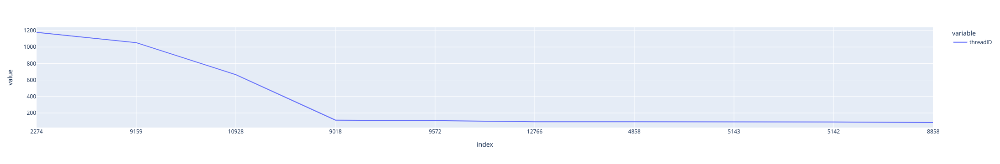

In [89]:
wallstreet.threadID.value_counts()[:10].plot()

## postDate

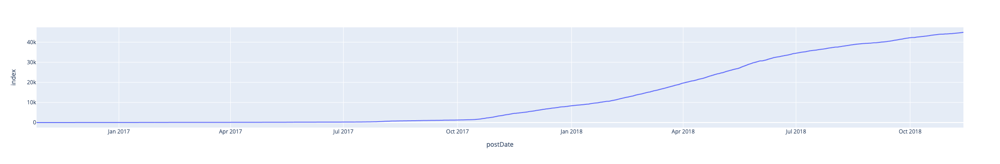

In [90]:
wallstreet.postDate.plot(x='postDate')

## Subforum

In [91]:
wallstreet.subforum[0]

"'Introductions'"

In [92]:
wallstreet.subforum.describe()

count       44907
unique         40
top       'Fraud'
freq        12100
Name: subforum, dtype: object

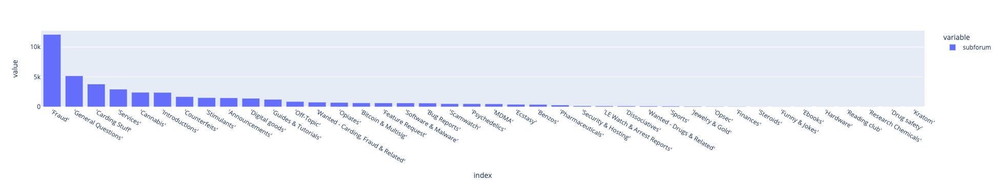

In [93]:
wallstreet.subforum.value_counts().plot.bar()

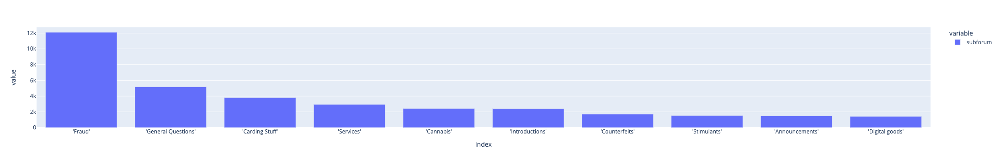

In [94]:
wallstreet.subforum.value_counts()[:10].plot.bar()

## postAuthorMembership

In [95]:
wallstreet.postAuthorMembership = wallstreet.postAuthorMembership.astype('str')
wallstreet.postAuthorMembership[0]

"'New member'"

In [96]:
wallstreet.postAuthorMembership.describe()

count        44907
unique           8
top       'Vendor'
freq         15115
Name: postAuthorMembership, dtype: object

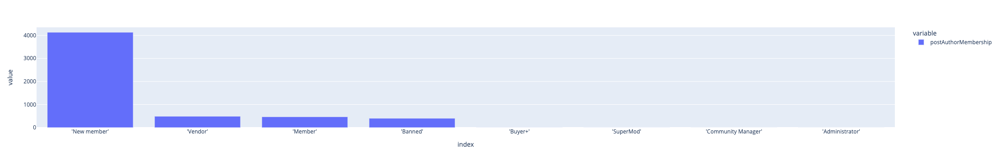

In [97]:
wallstreet.drop_duplicates(subset=['authorName']).postAuthorMembership.value_counts().plot.bar()

## Author Reputaiton

In [98]:
wallstreet.authorReputation = wallstreet.authorReputation.astype('int32')
wallstreet.authorReputation.describe()

count    44907.000000
mean       735.111007
std       1740.683867
min        -50.000000
25%          0.000000
50%          4.000000
75%        103.000000
max       5616.000000
Name: authorReputation, dtype: float64

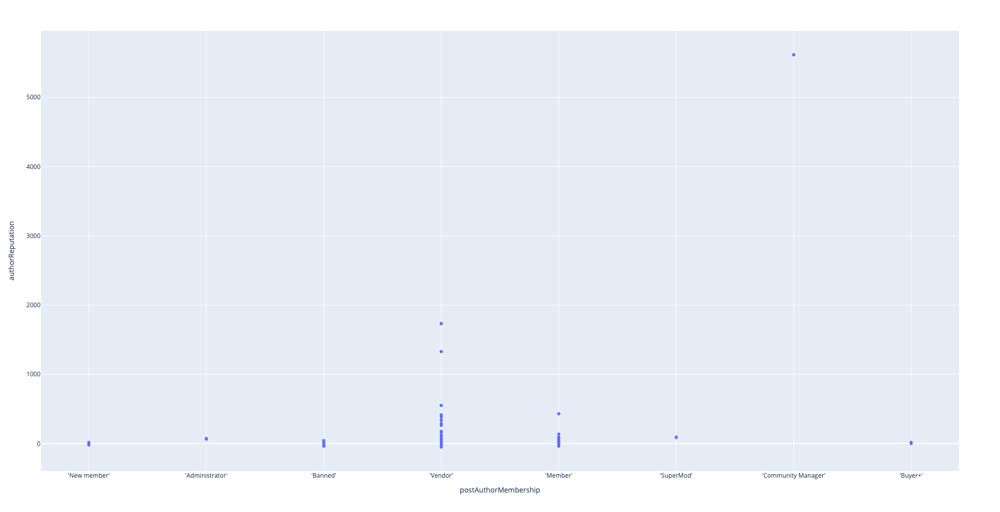

In [99]:
wallstreet.plot.scatter(x ='postAuthorMembership', y = 'authorReputation', width = 1000, height = 1000)

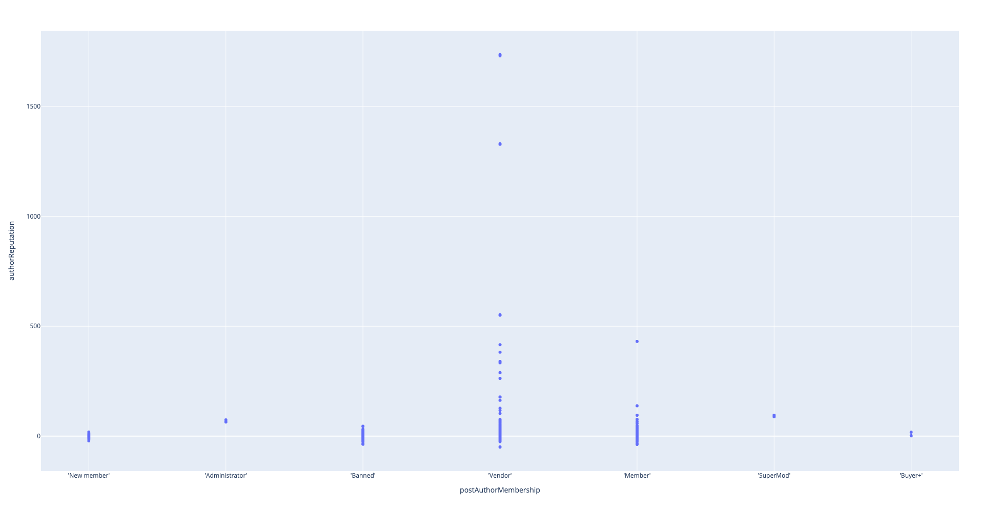

In [100]:
wallstreet[wallstreet['postAuthorMembership'].str.contains('Community Manager')== False ].plot.scatter(x ='postAuthorMembership', y = 'authorReputation', width = 1000, height = 1000)

In [101]:
wallstreet.authorName[14653]

"'6LACK'"

## Authors

In [102]:
wallstreet.authorName[0]

"'Punka421'"

In [103]:
wallstreet.authorName.describe()

count         44907
unique         5492
top       'med3l1n'
freq           4862
Name: authorName, dtype: object

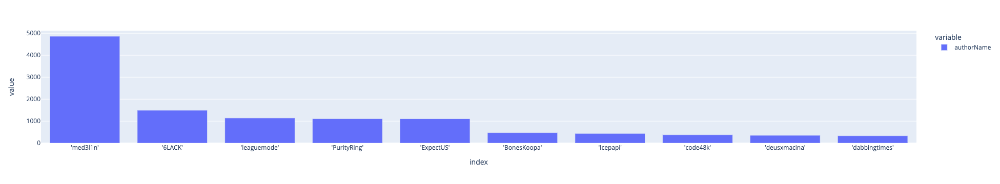

In [104]:
wallstreet.authorName.value_counts()[:10].plot.bar()

# Vendor 

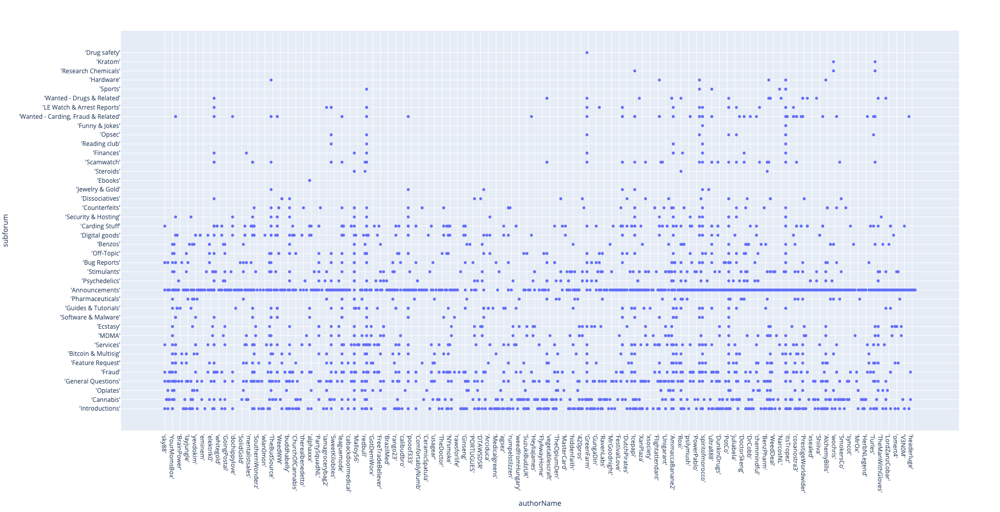

In [105]:
wallstreet[wallstreet['postAuthorMembership'].str.contains('Vendor')== True ].plot.scatter(x ='authorName', y = 'subforum', width = 1000, height = 1000)

## Vendor and Subform

We wan to learn about vendors now. Can we see what suboforms vendors like to go on?

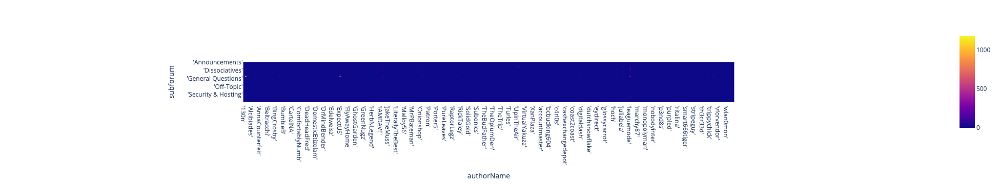

In [106]:
top_ten_subforum = wallstreet.subforum.value_counts().index.tolist()
df = wallstreet[wallstreet['postAuthorMembership'].str.contains('Vendor')== True ]
df = df[df['subforum'].isin(top_ten_subforum)]



ct_counts = df.groupby(['authorName', 'subforum']).size()
ct_counts = ct_counts.reset_index(name = 'count')
ct_counts = ct_counts.pivot(index = 'subforum', columns = 'authorName', values = 'count')
ct_counts = ct_counts.fillna(0)
fig = px.imshow(ct_counts)
fig.show()

In [107]:
df.head()

,threadID,threadTitle,URL,subforum,authorName,postAuthorMembership,authorReputation,postDate,postSequence,flatContent
21,38,'Intro','http://x7bwsmcore5fmx56.onion/viewtopic.php?i...,'Introductions','sky88','Vendor',-16,2016-12-03 11:58:22,1,"Hi, I'm sky88 an old scans vendor. I like the ..."
45,109,"'Hi everybody, im darkweeder and sell Hash'",'http://x7bwsmcore5fmx56.onion/viewtopic.php?i...,'Cannabis','darkweeder','Vendor',2,2017-01-21 02:44:21,1,Willkommen in Darkweeder's Drugstoreich bin ei...
81,288,'! THEFRENCHCONNECTION IS DOING AN HAPPY HOUR ...,'http://x7bwsmcore5fmx56.onion/viewtopic.php?i...,'Introductions','FRENCHCONNECTION','Vendor',-5,2017-02-23 20:05:58,1,HELLO EVERY ONE !!!THIS IS A MESSAGE FROM THE ...
82,289,'New promotion!get a free sample for your firs...,'http://x7bwsmcore5fmx56.onion/viewtopic.php?i...,'Opiates','FRENCHCONNECTION','Vendor',-5,2017-02-23 20:08:38,1,buy one of our opiates product and get free s...
109,420,'How become for free here ???','http://x7bwsmcore5fmx56.onion/viewtopic.php?i...,'General Questions','weedim','Vendor',-12,2017-04-10 04:04:14,1,"Hello,I have big experience on others markets ..."


## Author and Subforum

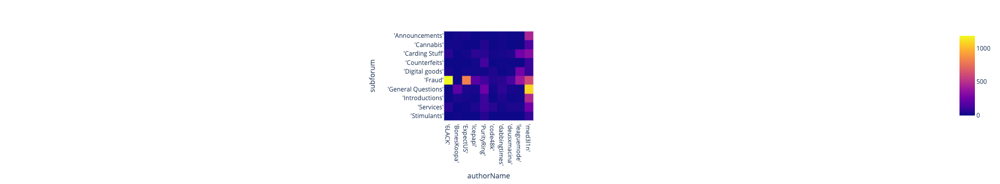

In [108]:
top_ten_author = wallstreet.authorName.value_counts()[:10].index.tolist()
top_ten_subforum = wallstreet.subforum.value_counts()[:10].index.tolist()
df = wallstreet[wallstreet['authorName'].isin(top_ten_author)]
df = df[df['subforum'].isin(top_ten_subforum)]
ct_counts = df.groupby(['authorName', 'subforum']).size()
ct_counts = ct_counts.reset_index(name = 'count')
ct_counts = ct_counts.pivot(index = 'subforum', columns = 'authorName', values = 'count')
ct_counts = ct_counts.fillna(0)
fig = px.imshow(ct_counts)
fig.show()

## Content

In [109]:
wallstreet.flatContent[0]

"Just thought I'd introduce myself. I am new to the communities and trying to learn as much as i can. Figured i may as well start here. So far i like the simplicity of the site. I hope it does go far. Im searching for any tips on carding and how-to stay secure. Thanks for reading. Stay safe"

# Machine Learning

## Question 1:

Can we determine the Author membership type from their posts?

In [40]:
#need to turn our author memberships into something our network can understand
wallstreet.postAuthorMembership = wallstreet.postAuthorMembership.astype('category')
wallstreet.postAuthorMembership = wallstreet.postAuthorMembership.cat.codes

In [41]:
from sklearn.feature_extraction import text

stop = text.ENGLISH_STOP_WORDS
vocab_size = 10000
max_len = 40

x = wallstreet.flatContent
y = LabelBinarizer().fit_transform(wallstreet.postAuthorMembership) #wallstreet.postAuthorMembership

x = x.apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))

x_train, x_valid, y_train, y_valid = train_test_split(x, y, test_size=0.3)

tokenizer = Tokenizer(num_words=vocab_size)

tokenizer.fit_on_texts(x_train)

def _preprocess(list_of_text):
    return pad_sequences(
        tokenizer.texts_to_sequences(list_of_text),
        maxlen=max_len,
        padding='post',
        )
x_train = _preprocess(x_train)
x_valid = _preprocess(x_valid)

print(x_train.shape, y_train.shape)
print(x_valid.shape, y_valid.shape)

(31434, 40) (31434, 8)
(13473, 40) (13473, 8)


In [42]:
print(tokenizer.sequences_to_texts(x_train[:5]))

["the order page says recieved a multisig transaction prepared 5 minutes please wait but happens even hours waiting change doesn't i'm stuck again it's just thing another npaste onion won't log different mirror listing offer 21086 pharmaceutical offer 21331 stimulants", "resold if interested stripe braintree bank drops business fulls personal fulls virtual carding opsec very important deep web fraud resources well guide looking for yes it's updated listing wallstyizjhkrvmj onion offer onion offer use mirror link copy offer price g", 'orders users web thanks relationship real utopia utopia13 utopia13 tasting offer utopia13 pack 4 premium hashish 1gr 1 nicole kush2 dry ice super skunk3 bubba haze4 royal kingto know products present delicious pack enjoy 4 different hashish right palate utopia', 'quality and service to everyone in the community have a great week happy shopping quickship2u nquickship2u source best quality products promptly safe stealth highest priority packaging goods we tr

In [43]:
print('total words in the dictionary:', tokenizer.num_words)

total words in the dictionary: 10000


In [44]:
seq_in = keras.Input(batch_shape=(None, max_len))
embedded = keras.layers.Embedding(tokenizer.num_words, 16)(seq_in)
l1 = GRU(16, return_sequences=True)(embedded)
flattened = Flatten()(l1)
#l2 = Dense(16, activation='relu')(flattened)
out = Dense(8, activation='softmax')(flattened)

model = keras.Model(
    inputs=seq_in,
    outputs=out
    )
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
loss=tf.keras.losses.CategoricalCrossentropy(),metrics=['accuracy', 'AUC'])

In [45]:
history = model.fit(x_train,
                    y_train,
                    epochs=5,
                    batch_size=128,
                    verbose=1,
                    validation_data = (x_valid, y_valid))
predict_matrix = model.predict(x_valid)
pred_vector = predict_matrix.argmax(1)
y_valid_vector = y_valid.argmax(1)

Epoch 1/5
246/246 [==============================] - 5s 10ms/step - loss: 1.0999 - accuracy: 0.5309 - auc: 0.9102 - val_loss: 0.8288 - val_accuracy: 0.6503 - val_auc: 0.9488
Epoch 2/5
246/246 [==============================] - 2s 7ms/step - loss: 0.7121 - accuracy: 0.6865 - auc: 0.9615 - val_loss: 0.7262 - val_accuracy: 0.6787 - val_auc: 0.9595
Epoch 3/5
246/246 [==============================] - 2s 7ms/step - loss: 0.6165 - accuracy: 0.7277 - auc: 0.9711 - val_loss: 0.7136 - val_accuracy: 0.6905 - val_auc: 0.9613
Epoch 4/5
246/246 [==============================] - 2s 8ms/step - loss: 0.5459 - accuracy: 0.7662 - auc: 0.9776 - val_loss: 0.7254 - val_accuracy: 0.6939 - val_auc: 0.9607
Epoch 5/5
246/246 [==============================] - 2s 8ms/step - loss: 0.4873 - accuracy: 0.7995 - auc: 0.9823 - val_loss: 0.7539 - val_accuracy: 0.6961 - val_auc: 0.9592


In [46]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 40)]              0         
_________________________________________________________________
embedding (Embedding)        (None, 40, 16)            160000    
_________________________________________________________________
gru (GRU)                    (None, 40, 16)            1632      
_________________________________________________________________
flatten (Flatten)            (None, 640)               0         
_________________________________________________________________
dense (Dense)                (None, 8)                 5128      
Total params: 166,760
Trainable params: 166,760
Non-trainable params: 0
_________________________________________________________________


In [47]:
import plotly.figure_factory as ff
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_valid_vector, pred_vector)
z = cf_matrix

# invert z idx values
z = z[::-1]
x = ['Administrator', 'Banned', 'Buyer+', 'Community Manager', 'Member', 'New member', 'SuperMod', 'Vendor']
#x = ['0', '1','2','3','4','5','6','7']
y =  x[::-1].copy() # invert idx values of x

# change each element of z to type string for annotations
z_text = [[str(y) for y in x] for x in z]

# set up figure 
fig = ff.create_annotated_heatmap(z, x=x, y=y, annotation_text=z_text)

# add title
fig.update_layout(title_text='<i><b>Membership based on post information</b></i>',
                  #xaxis = dict(title='x'),
                  #yaxis = dict(title='x')
                 )

# add custom xaxis title
fig.add_annotation(dict(font=dict(color="black",size=14),
                        x=0.5,
                        y=-0.15,
                        showarrow=False,
                        text="Predicted value",
                        xref="paper",
                        yref="paper"))

## Question 2:

Can we find vendors on public forums?

In [48]:
#need to turn our author memberships into something our network can understand
wallstreet.postAuthorMembership = wallstreet.postAuthorMembership.astype('category')
wallstreet.postAuthorMembership = wallstreet.postAuthorMembership.cat.codes

In [49]:
train_val_list = ["'Fraud'", "'General Questions'", "'Carding Stuff'", "'Services'", "'Cannabis'", "'Introductions'", "'Counterfeits'", "'Stimulants'", "'Announcements'", "'Digital goods'",  "'Wanted - Carding, Fraud & Related'", "'Opiates'", "'Feature Request'", "'Software & Malware'","'Scamwatch'", "'Psychedelics'", "'MDMA'", "'Ecstasy'", "'Benzos'", "'Pharmaceuticals'", "'Security & Hosting'",  "'Dissociatives'", "'Wanted - Drugs & Related'", "'Opsec'", "'Steroids'",  "'Research Chemicals'", "'Hardware'",  "'Kratom'"]
testing_list = ["'Guides & Tutorials'", "'Off-Topic'","'Bitcoin & Multisig'", "'Bug Reports'", "'LE Watch & Arrest Reports'", "'Sports'", "'Jewelry & Gold'","'Finances'","'Funny & Jokes'", "'Ebooks'", "'Reading club'", "'Drug safety'",]

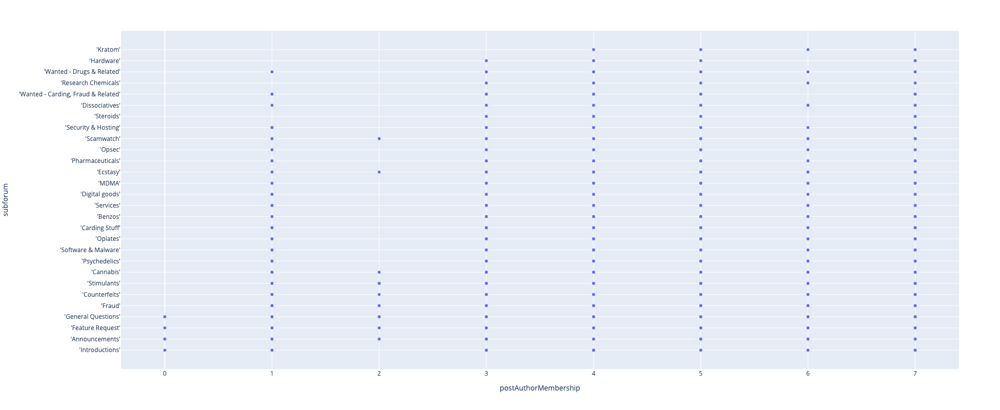

In [50]:
#training and val
wallstreet.loc[wallstreet['subforum'].isin(train_val_list)].plot.scatter(x ='postAuthorMembership', y = 'subforum', width=800, height=800)

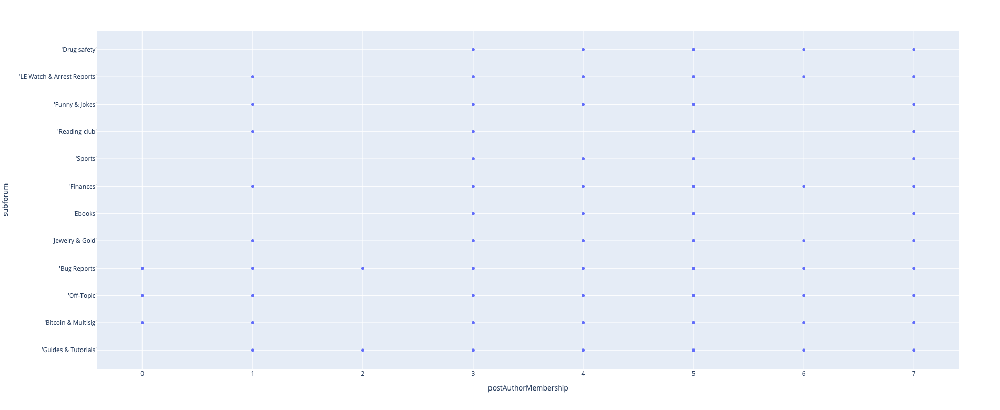

In [51]:
# testing set
wallstreet.loc[wallstreet['subforum'].isin(testing_list)].plot.scatter(x ='postAuthorMembership', y = 'subforum', width=800, height=800)

In [52]:
from sklearn.feature_extraction import text

stop = text.ENGLISH_STOP_WORDS
vocab_size = 10000
max_len = 40



x = wallstreet.loc[wallstreet['subforum'].isin(train_val_list)].flatContent
y = LabelBinarizer().fit_transform(wallstreet.loc[wallstreet['subforum'].isin(train_val_list)].postAuthorMembership)



x = x.apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))

x_train, x_valid, y_train, y_valid = train_test_split(x, y, test_size=0.3)

tokenizer = Tokenizer(num_words=vocab_size)

tokenizer.fit_on_texts(x_train)

def _preprocess(list_of_text):
    return pad_sequences(
        tokenizer.texts_to_sequences(list_of_text),
        maxlen=max_len,
        padding='post',
        )
x_train = _preprocess(x_train)
x_valid = _preprocess(x_valid)

print(x_train.shape, y_train.shape)
print(x_valid.shape, y_valid.shape)

(28702, 40) (28702, 8)
(12301, 40) (12301, 8)


In [53]:
x_test = wallstreet.loc[wallstreet['subforum'].isin(testing_list)].flatContent
y_test = LabelBinarizer().fit_transform(wallstreet.loc[wallstreet['subforum'].isin(testing_list)].postAuthorMembership)
x_test = _preprocess(x_test)
print(x_test.shape, x_test.shape)

(3904, 40) (3904, 40)


In [54]:
seq_in = keras.Input(batch_shape=(None, max_len))
embedded = keras.layers.Embedding(tokenizer.num_words, 16)(seq_in)
l1 = GRU(16, return_sequences=True)(embedded)
flattened = Flatten()(l1)
#l2 = Dense(16, activation='relu')(flattened)
out = Dense(8, activation='softmax')(flattened)

model = keras.Model(
    inputs=seq_in,
    outputs=out
    )
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
loss=tf.keras.losses.CategoricalCrossentropy(),metrics=['accuracy', 'AUC'])

In [55]:
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 40)]              0         
_________________________________________________________________
embedding_1 (Embedding)      (None, 40, 16)            160000    
_________________________________________________________________
gru_1 (GRU)                  (None, 40, 16)            1632      
_________________________________________________________________
flatten_1 (Flatten)          (None, 640)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 8)                 5128      
Total params: 166,760
Trainable params: 166,760
Non-trainable params: 0
_________________________________________________________________


In [56]:
history = model.fit(x_train,
                    y_train,
                    epochs=4,
                    batch_size=128,
                    verbose=1,
                    validation_data = (x_valid, y_valid))
predict_matrix = model.predict(x_test)
pred_vector = predict_matrix.argmax(1)
y_test_vector = y_test.argmax(1)

Epoch 1/4
225/225 [==============================] - 4s 10ms/step - loss: 1.1227 - accuracy: 0.5354 - auc: 0.9071 - val_loss: 0.7926 - val_accuracy: 0.6452 - val_auc: 0.9520
Epoch 2/4
225/225 [==============================] - 2s 8ms/step - loss: 0.7221 - accuracy: 0.6854 - auc: 0.9606 - val_loss: 0.7072 - val_accuracy: 0.6904 - val_auc: 0.9618
Epoch 3/4
225/225 [==============================] - 2s 8ms/step - loss: 0.6172 - accuracy: 0.7350 - auc: 0.9713 - val_loss: 0.6936 - val_accuracy: 0.7013 - val_auc: 0.9636
Epoch 4/4
225/225 [==============================] - 2s 8ms/step - loss: 0.5391 - accuracy: 0.7784 - auc: 0.9785 - val_loss: 0.7026 - val_accuracy: 0.7039 - val_auc: 0.9632


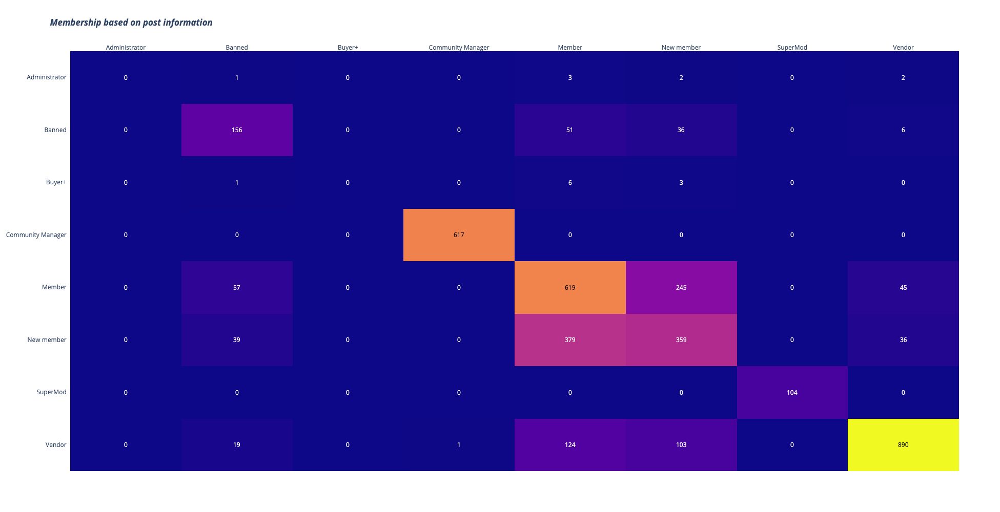

In [57]:
import plotly.figure_factory as ff
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_test_vector, pred_vector)
z = cf_matrix

# invert z idx values
z = z[::-1]
x = ['Administrator', 'Banned', 'Buyer+', 'Community Manager', 'Member', 'New member', 'SuperMod', 'Vendor']
#x = ['0', '1','2','3','4','5','6','7']
y =  x[::-1].copy() # invert idx values of x

# change each element of z to type string for annotations
z_text = [[str(y) for y in x] for x in z]

# set up figure 
fig = ff.create_annotated_heatmap(z, x=x, y=y, annotation_text=z_text)

# add title
fig.update_layout(title_text='<i><b>Membership based on post information</b></i>',width=1000, height = 1000
                  #xaxis = dict(title='x'),
                  #yaxis = dict(title='x')
                 )

# add custom xaxis title
fig.add_annotation(dict(font=dict(color="black",size=14),
                        x=0.5,
                        y=-0.15,
                        showarrow=False,
                        text="Predicted value",
                        xref="paper",
                        yref="paper"))

In [58]:
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(y_test_vector, pred_vector, pos_label=2)
metrics.auc(fpr, tpr)

0.4190934771443246

## Question 3:
What if we have a binary classification issue?

In [110]:
wallstreet.postAuthorMembership = wallstreet.postAuthorMembership.astype('str')
wallstreet.postAuthorMembership = wallstreet.postAuthorMembership.replace("'Member'", "'Not Vendor'")
wallstreet.postAuthorMembership = wallstreet.postAuthorMembership.replace("'New member'", "'Not Vendor'")
wallstreet.postAuthorMembership = wallstreet.postAuthorMembership.replace("'Community Manager'", "'Not Vendor'")
wallstreet.postAuthorMembership = wallstreet.postAuthorMembership.replace("'Banned'", "'Not Vendor'")
wallstreet.postAuthorMembership = wallstreet.postAuthorMembership.replace("'SuperMod'", "'Not Vendor'")
wallstreet.postAuthorMembership = wallstreet.postAuthorMembership.replace("'Administrator'", "'Not Vendor'")
wallstreet.postAuthorMembership = wallstreet.postAuthorMembership.replace("'Buyer+'", "'Not Vendor'")


wallstreet.postAuthorMembership = wallstreet.postAuthorMembership.astype('category')

In [111]:
wallstreet.postAuthorMembership.value_counts()

'Not Vendor'    29792
'Vendor'        15115
Name: postAuthorMembership, dtype: int64

In [112]:
wallstreet.postAuthorMembership = wallstreet.postAuthorMembership.cat.codes

In [113]:
train_val_list = ["'Fraud'", "'General Questions'", "'Carding Stuff'", "'Services'", "'Cannabis'", "'Introductions'", "'Counterfeits'", "'Stimulants'", "'Announcements'", "'Digital goods'",  "'Wanted - Carding, Fraud & Related'", "'Opiates'", "'Feature Request'", "'Software & Malware'","'Scamwatch'", "'Psychedelics'", "'MDMA'", "'Ecstasy'", "'Benzos'", "'Pharmaceuticals'", "'Security & Hosting'",  "'Dissociatives'", "'Wanted - Drugs & Related'", "'Opsec'", "'Steroids'",  "'Research Chemicals'", "'Hardware'",  "'Kratom'"]
testing_list = ["'Guides & Tutorials'", "'Off-Topic'","'Bitcoin & Multisig'", "'Bug Reports'", "'LE Watch & Arrest Reports'", "'Sports'", "'Jewelry & Gold'","'Finances'","'Funny & Jokes'", "'Ebooks'", "'Reading club'", "'Drug safety'",]

In [114]:
from sklearn.feature_extraction import text

stop = text.ENGLISH_STOP_WORDS
vocab_size = 10000
max_len = 40



x = wallstreet.loc[wallstreet['subforum'].isin(train_val_list)].flatContent
y = LabelBinarizer().fit_transform(wallstreet.loc[wallstreet['subforum'].isin(train_val_list)].postAuthorMembership)



x = x.apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))

x_train, x_valid, y_train, y_valid = train_test_split(x, y, test_size=0.3)

tokenizer = Tokenizer(num_words=vocab_size)

tokenizer.fit_on_texts(x_train)

def _preprocess(list_of_text):
    return pad_sequences(
        tokenizer.texts_to_sequences(list_of_text),
        maxlen=max_len,
        padding='post',
        )
x_train = _preprocess(x_train)
x_valid = _preprocess(x_valid)

print(x_train.shape, y_train.shape)
print(x_valid.shape, y_valid.shape)

(28702, 40) (28702, 1)
(12301, 40) (12301, 1)


In [115]:
x_test = wallstreet.loc[wallstreet['subforum'].isin(testing_list)].flatContent
y_test = LabelBinarizer().fit_transform(wallstreet.loc[wallstreet['subforum'].isin(testing_list)].postAuthorMembership)
x_test = _preprocess(x_test)
print(x_test.shape, y_test.shape)

(3904, 40) (3904, 1)


In [116]:
seq_in = keras.Input(batch_shape=(None, max_len))
embedded = keras.layers.Embedding(tokenizer.num_words, 42)(seq_in)
l1 = GRU(42, return_sequences=True)(embedded)
flattened = Flatten()(l1)
#l2 = Dense(16, activation='relu')(flattened)
out = Dense(1, activation='sigmoid')(flattened)

model = keras.Model(
    inputs=seq_in,
    outputs=out
    )
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
loss=tf.keras.losses.BinaryCrossentropy(),metrics=['accuracy', 'AUC'])

In [117]:
import numpy as np
history = model.fit(x_train,
                    y_train,
                    epochs=5,
                    batch_size=64,
                    verbose=1,
                    validation_data = (x_valid, y_valid))
predict_matrix = model.predict(x_test)
pred_vector = np.round(predict_matrix)
y_test_vector = y_test

Epoch 1/5
449/449 [==============================] - 6s 9ms/step - loss: 0.3066 - accuracy: 0.8707 - auc: 0.9230 - val_loss: 0.2417 - val_accuracy: 0.9042 - val_auc: 0.9539
Epoch 2/5
449/449 [==============================] - 4s 8ms/step - loss: 0.1992 - accuracy: 0.9205 - auc: 0.9657 - val_loss: 0.2317 - val_accuracy: 0.9108 - val_auc: 0.9551
Epoch 3/5
449/449 [==============================] - 3s 8ms/step - loss: 0.1621 - accuracy: 0.9350 - auc: 0.9781 - val_loss: 0.2449 - val_accuracy: 0.9115 - val_auc: 0.9541
Epoch 4/5
449/449 [==============================] - 3s 8ms/step - loss: 0.1282 - accuracy: 0.9502 - auc: 0.9867 - val_loss: 0.2850 - val_accuracy: 0.9067 - val_auc: 0.9492
Epoch 5/5
449/449 [==============================] - 3s 8ms/step - loss: 0.0979 - accuracy: 0.9608 - auc: 0.9924 - val_loss: 0.3114 - val_accuracy: 0.9050 - val_auc: 0.9455


In [118]:
model.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 40)]              0         
_________________________________________________________________
embedding_3 (Embedding)      (None, 40, 42)            420000    
_________________________________________________________________
gru_3 (GRU)                  (None, 40, 42)            10836     
_________________________________________________________________
flatten_3 (Flatten)          (None, 1680)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 1681      
Total params: 432,517
Trainable params: 432,517
Non-trainable params: 0
_________________________________________________________________


In [119]:
import plotly.figure_factory as ff
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_test_vector, pred_vector)


In [120]:
cf_matrix

array([[2657,  110],
       [ 224,  913]])

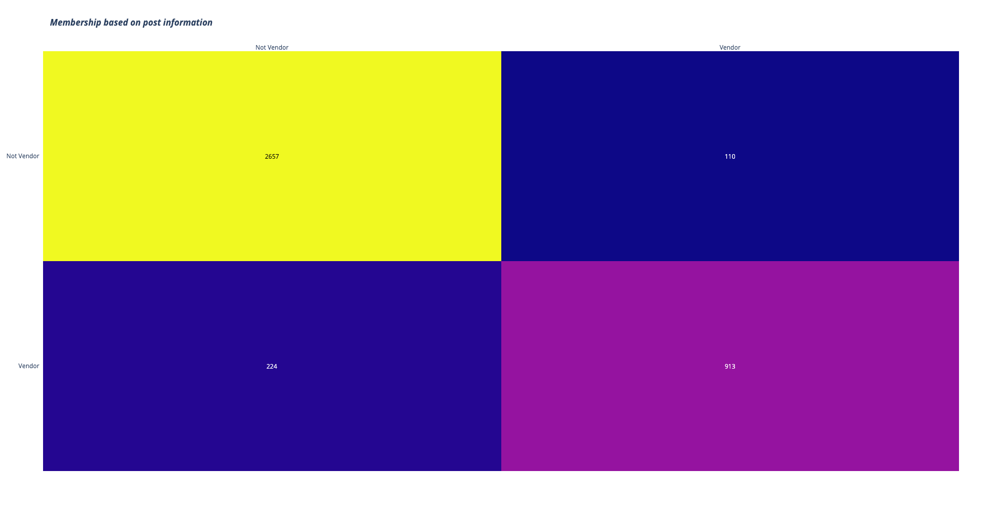

In [121]:
z = cf_matrix

# invert z idx values
z = z[::-1]
x = ['Not Vendor', 'Vendor']
#x = ['0', '1','2','3','4','5','6','7']
y =  x[::-1].copy() # invert idx values of x

# change each element of z to type string for annotations
z_text = [[str(y) for y in x] for x in z]

# set up figure 
fig = ff.create_annotated_heatmap(z, x=x, y=y, annotation_text=z_text)

# add title
fig.update_layout(title_text='<i><b>Membership based on post information</b></i>',width=1000, height = 1000
                  #xaxis = dict(title='x'),
                  #yaxis = dict(title='x')
                 )

# add custom xaxis title
fig.add_annotation(dict(font=dict(color="black",size=14),
                        x=0.5,
                        y=-0.15,
                        showarrow=False,
                        text="Predicted value",
                        xref="paper",
                        yref="paper"))

In [122]:
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(y_test_vector, pred_vector)
metrics.auc(fpr, tpr)

0.8816180394707188

In [123]:
metrics.accuracy_score(y_test_vector,pred_vector )

0.9144467213114754

In [124]:
metrics.f1_score(y_test_vector,pred_vector )

0.8453703703703704

In [125]:
metrics.precision_score(y_test_vector,pred_vector )

0.8924731182795699

In [126]:
metrics.recall_score(y_test_vector,pred_vector )

0.802990325417766